# **Thank You for opening this notebook!!!**
## **If you find this notebook useful then please upvote.**

# Introduction to Exploritary Data Analysis
Analyzing a dataset typically involves several key steps :
1. [Step 0: Imports and Reading data](#1)
2. [Step 1: data Understanding](#2)
3. [Step 2: data Prep](#3)
4. [Step 3: Feature Understanding](#4)
5. [Step 4: Feature Relationships](#5)
6. [Step 5: Analyse Hypothese](#6)
7. [Step 6: data Cleaning](#7)
8. [Step 7: Model Building (If Applicable):](#8)
9. [Step 8: Model Evaluation:](#9)
10. [Step 9: Make Pipline:](#10)
11. [Step 10: Feature Engineering:](#11)
12. [Step 11: Feature Scalling:](#12)


# [Step 0: Imports and Reading data]()<a id="1"></a> <br>

In [46]:
import pandas as pd
import numpy as np
import matplotlib.pylab as plt
import seaborn as sns
import scipy.stats as sc
import statistics as st
pd.set_option('display.max_row',111)
pd.set_option('display.max_column',111)
# plt.style.use('dark_background')
plt.style.use('ggplot')

df = pd.read_csv('D:\Paractical data scientist\Mobile Price Classification\\train.csv')
df = df.copy()

# [Step 1: data Understanding]()<a id="2"></a> <br>
- Analysis the shape : We'll just focus on the form of data : Ndr of rows & columns : (150, 5)

In [47]:
df.drop_duplicates(inplace = True)
df.head(5)

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,2,20,756,2549,9,7,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,6,905,1988,2631,17,3,7,1,1,0,2
2,563,1,0.5,1,2,1,41,0.9,145,5,6,1263,1716,2603,11,2,9,1,1,0,2
3,615,1,2.5,0,0,0,10,0.8,131,6,9,1216,1786,2769,16,8,11,1,0,0,2
4,1821,1,1.2,0,13,1,44,0.6,141,2,14,1208,1212,1411,8,2,15,1,1,0,1


* In this data:
    * id:ID
    * battery_power:Total energy a battery can store in one time measured in mAh
    * blue:Has bluetooth or not
    * clock_speed:speed at which microprocessor executes instructions
    * dual_sim:Has dual sim support or not
    * fc:Front Camera mega pixels
    * four_g:Has 4G or not
    * int_memory:Internal Memory in Gigabytes
    * m_dep:Mobile Depth in cm
    * mobile_wt:Weight of mobile phone
    * n_cores:Number of cores of processor
    * pc:Primary Camera mega pixels
    * px_height:Pixel Resolution Height
    * px_width:Pixel Resolution Width
    * ram:Random Access Memory in Megabytes
    * sc_h:Screen Height of mobile in cm
    * sc_w:Screen Width of mobile in cm
    * talk_time:longest time that a single battery charge will last when you are
    * three_g:Has 3G or not
    * touch_screen:Has touch screen or not
    * wifi:Has wifi or not

In [48]:
df.shape  

(2000, 21)

In [49]:
df.columns

Index(['battery_power', 'blue', 'clock_speed', 'dual_sim', 'fc', 'four_g',
       'int_memory', 'm_dep', 'mobile_wt', 'n_cores', 'pc', 'px_height',
       'px_width', 'ram', 'sc_h', 'sc_w', 'talk_time', 'three_g',
       'touch_screen', 'wifi', 'price_range'],
      dtype='object')

In [50]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   battery_power  2000 non-null   int64  
 1   blue           2000 non-null   int64  
 2   clock_speed    2000 non-null   float64
 3   dual_sim       2000 non-null   int64  
 4   fc             2000 non-null   int64  
 5   four_g         2000 non-null   int64  
 6   int_memory     2000 non-null   int64  
 7   m_dep          2000 non-null   float64
 8   mobile_wt      2000 non-null   int64  
 9   n_cores        2000 non-null   int64  
 10  pc             2000 non-null   int64  
 11  px_height      2000 non-null   int64  
 12  px_width       2000 non-null   int64  
 13  ram            2000 non-null   int64  
 14  sc_h           2000 non-null   int64  
 15  sc_w           2000 non-null   int64  
 16  talk_time      2000 non-null   int64  
 17  three_g        2000 non-null   int64  
 18  touch_sc

In [51]:
df.describe()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
count,2000.000000,2000.0000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
mean,1238.518500,0.4950,1.522250,0.509500,4.309500,0.521500,32.046500,0.501750,140.249000,4.520500,9.916500,645.108000,1251.515500,2124.213000,12.306500,5.767000,11.011000,0.761500,0.503000,0.507000,1.500000
std,439.418206,0.5001,0.816004,0.500035,4.341444,0.499662,18.145715,0.288416,35.399655,2.287837,6.064315,443.780811,432.199447,1084.732044,4.213245,4.356398,5.463955,0.426273,0.500116,0.500076,1.118314
min,501.000000,0.0000,0.500000,0.000000,0.000000,0.000000,2.000000,0.100000,80.000000,1.000000,0.000000,0.000000,500.000000,256.000000,5.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000
25%,851.750000,0.0000,0.700000,0.000000,1.000000,0.000000,16.000000,0.200000,109.000000,3.000000,5.000000,282.750000,874.750000,1207.500000,9.000000,2.000000,6.000000,1.000000,0.000000,0.000000,0.750000
50%,1226.000000,0.0000,1.500000,1.000000,3.000000,1.000000,32.000000,0.500000,141.000000,4.000000,10.000000,564.000000,1247.000000,2146.500000,12.000000,5.000000,11.000000,1.000000,1.000000,1.000000,1.500000
75%,1615.250000,1.0000,2.200000,1.000000,7.000000,1.000000,48.000000,0.800000,170.000000,7.000000,15.000000,947.250000,1633.000000,3064.500000,16.000000,9.000000,16.000000,1.000000,1.000000,1.000000,2.250000
max,1998.000000,1.0000,3.000000,1.000000,19.000000,1.000000,64.000000,1.000000,200.000000,8.000000,20.000000,1960.000000,1998.000000,3998.000000,19.000000,18.000000,20.000000,1.000000,1.000000,1.000000,3.000000


# [Step 2: data Preperation]()<a id="3"></a> <br>

- - visualisation val missing : (visualisation of array[True, False] in order to detect nan(% of emptying))

<Axes: >

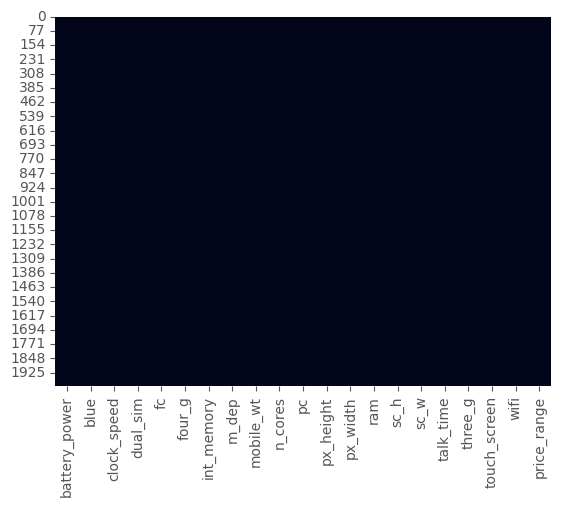

In [52]:
sns.heatmap(df.isnull(), cbar=False)

# [Step 3: Feature Understanding]()<a id="4"></a> <br>

- - Analyse target : (reg or classif) / (variables type:'numerical' or 'categorical') / (equilibre or not) classif non equilibre 10% of var1

<Axes: ylabel='proportion'>

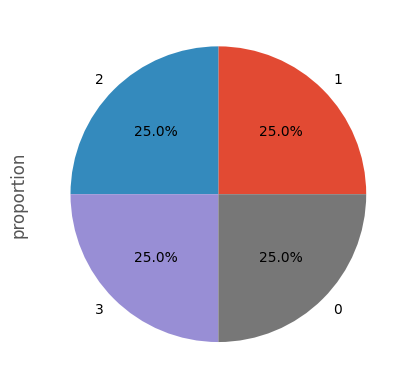

In [53]:
df['price_range'].value_counts(normalize=True).plot.pie(autopct='%1.1f%%')

Text(0.5, 0, 'price_range')

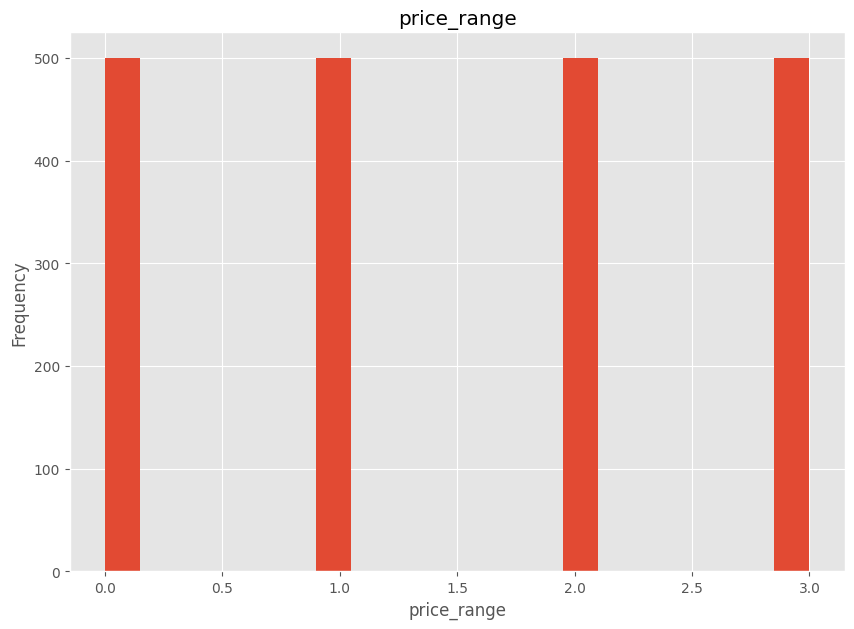

In [54]:
plt.figure(figsize=(10,7))
ax = df['price_range'].plot(kind='hist',bins=20,title='price_range')
ax.set_xlabel('price_range')

- - Histo des variables columns number : (distibution normale ou gausien symetrique or not) / uniforme / multi modale

c:\Users\Farouq MOUSMI\anaconda3\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 600x500 with 0 Axes>

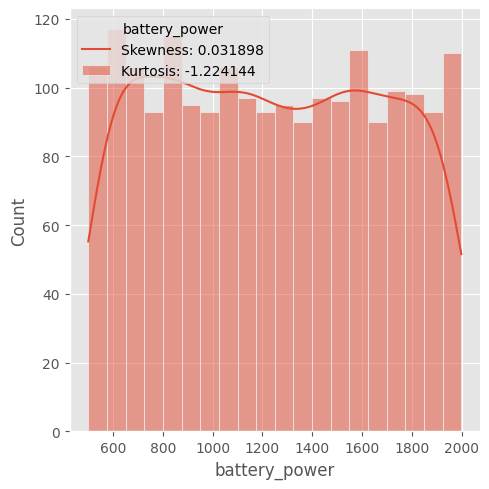

c:\Users\Farouq MOUSMI\anaconda3\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 600x500 with 0 Axes>

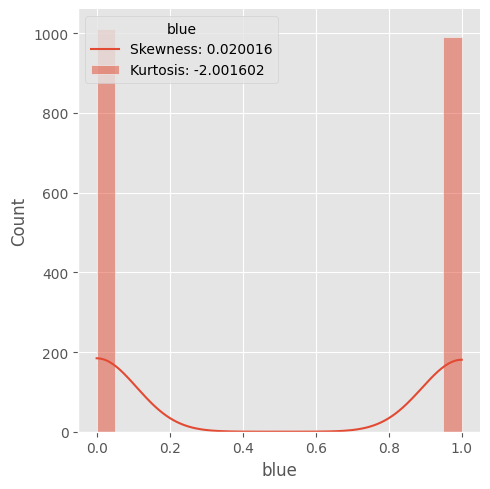

c:\Users\Farouq MOUSMI\anaconda3\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 600x500 with 0 Axes>

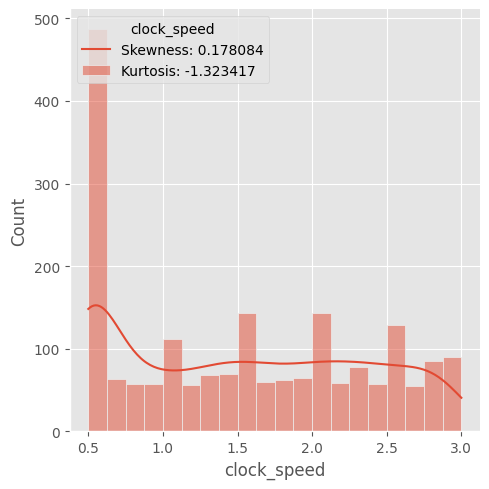

c:\Users\Farouq MOUSMI\anaconda3\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 600x500 with 0 Axes>

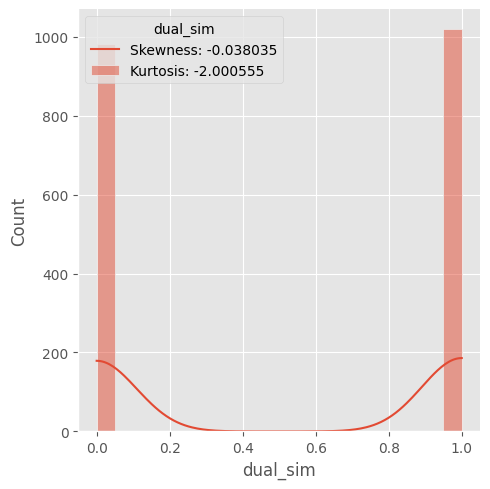

c:\Users\Farouq MOUSMI\anaconda3\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 600x500 with 0 Axes>

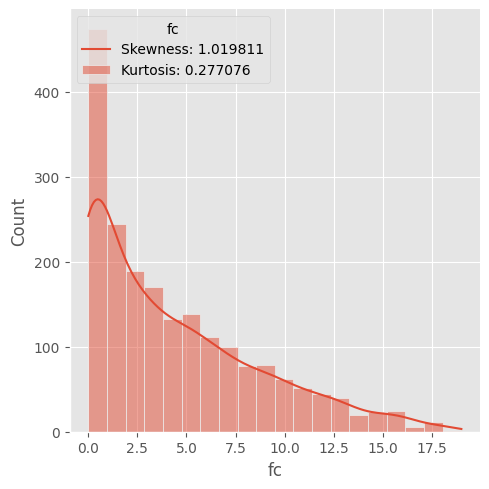

c:\Users\Farouq MOUSMI\anaconda3\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 600x500 with 0 Axes>

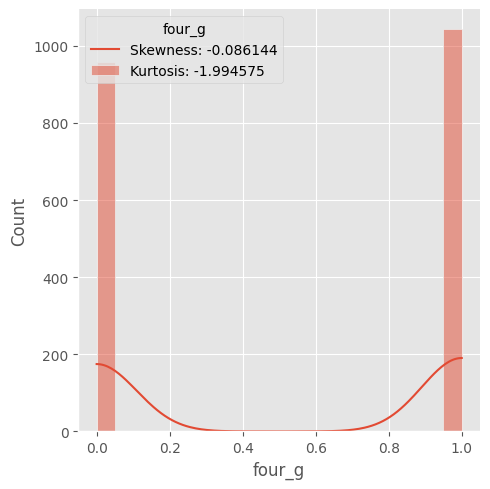

c:\Users\Farouq MOUSMI\anaconda3\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 600x500 with 0 Axes>

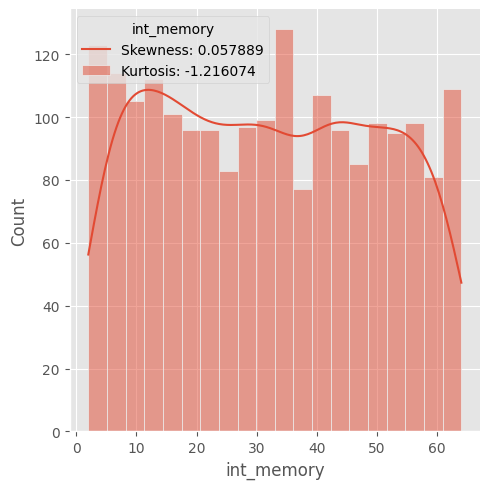

c:\Users\Farouq MOUSMI\anaconda3\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 600x500 with 0 Axes>

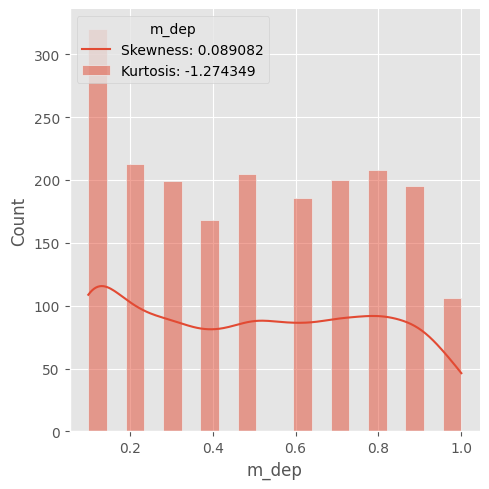

c:\Users\Farouq MOUSMI\anaconda3\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 600x500 with 0 Axes>

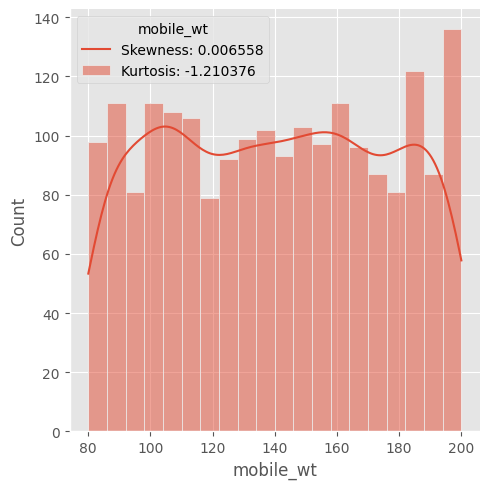

c:\Users\Farouq MOUSMI\anaconda3\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 600x500 with 0 Axes>

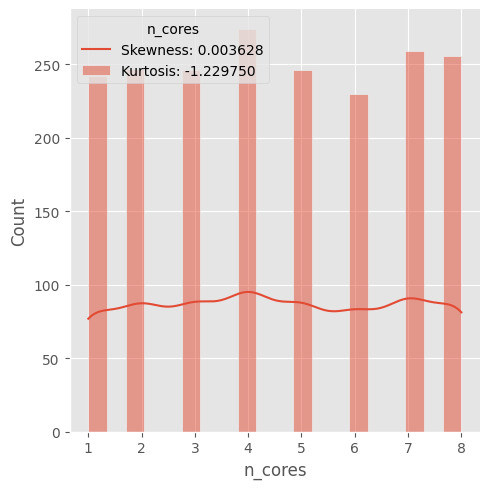

c:\Users\Farouq MOUSMI\anaconda3\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 600x500 with 0 Axes>

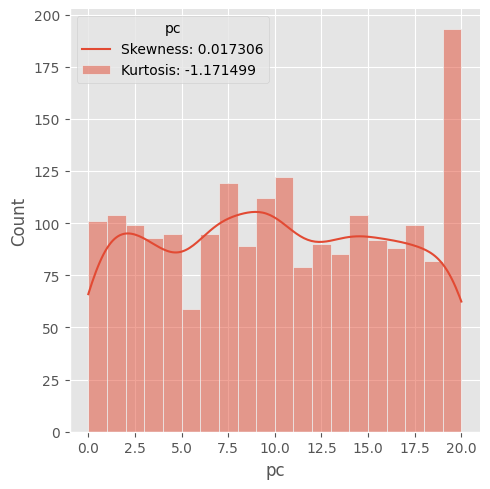

c:\Users\Farouq MOUSMI\anaconda3\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 600x500 with 0 Axes>

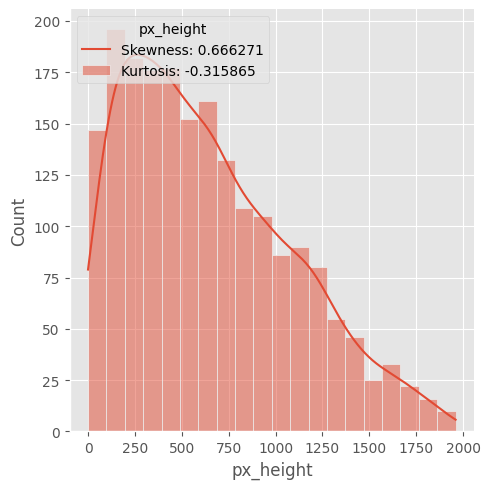

c:\Users\Farouq MOUSMI\anaconda3\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 600x500 with 0 Axes>

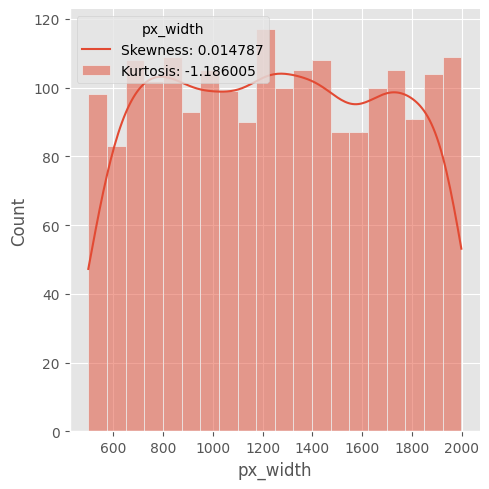

c:\Users\Farouq MOUSMI\anaconda3\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 600x500 with 0 Axes>

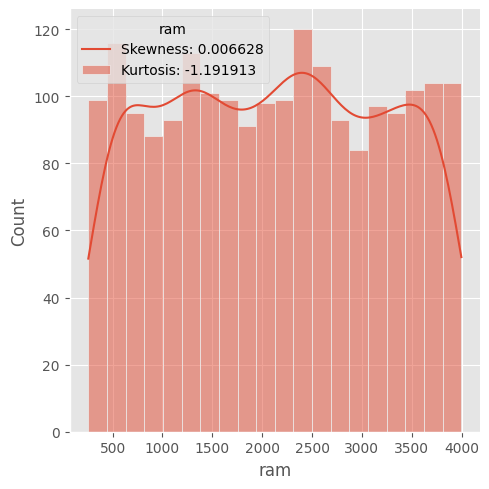

c:\Users\Farouq MOUSMI\anaconda3\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 600x500 with 0 Axes>

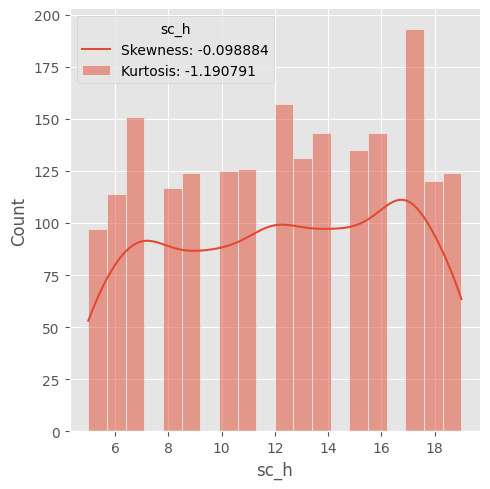

c:\Users\Farouq MOUSMI\anaconda3\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 600x500 with 0 Axes>

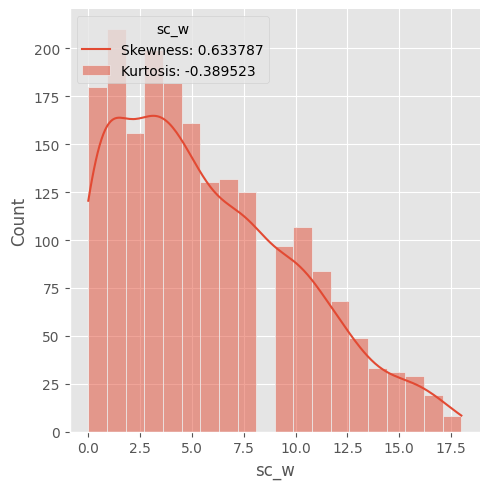

c:\Users\Farouq MOUSMI\anaconda3\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 600x500 with 0 Axes>

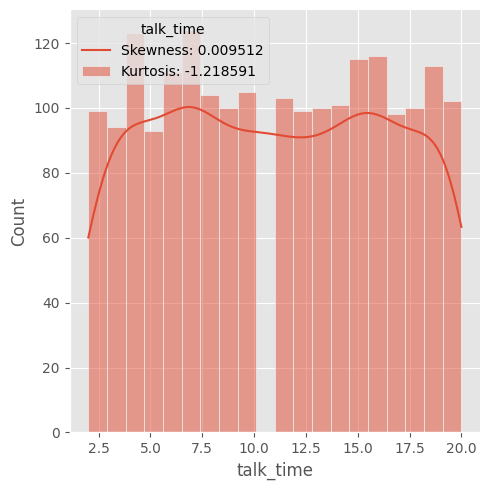

c:\Users\Farouq MOUSMI\anaconda3\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 600x500 with 0 Axes>

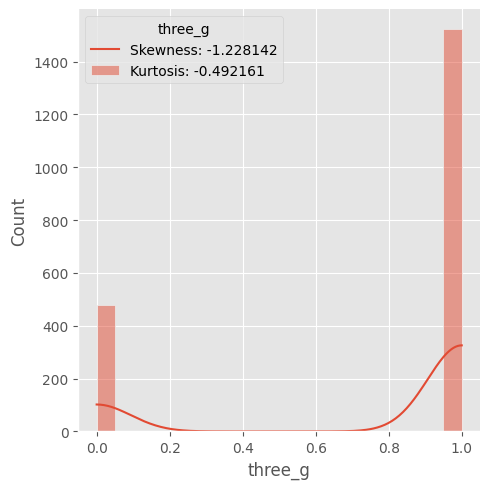

c:\Users\Farouq MOUSMI\anaconda3\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 600x500 with 0 Axes>

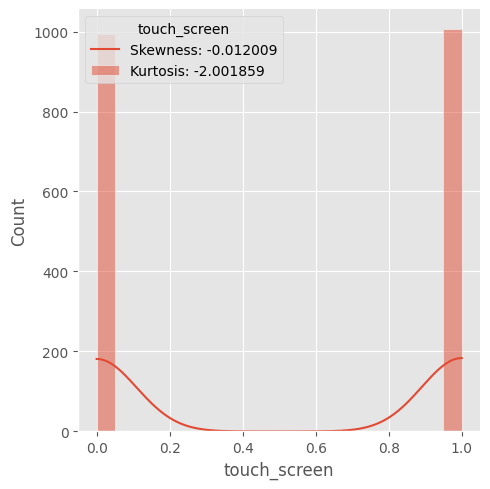

c:\Users\Farouq MOUSMI\anaconda3\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 600x500 with 0 Axes>

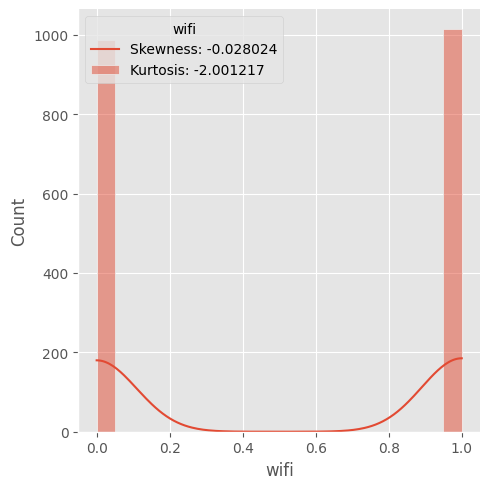

c:\Users\Farouq MOUSMI\anaconda3\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 600x500 with 0 Axes>

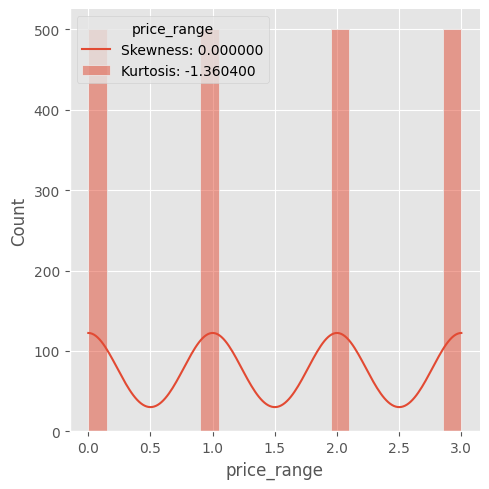

In [55]:
for col in df.select_dtypes(include=['int','float']):
    plt.figure(figsize=(6,5))
    ax = sns.displot(df, x=col,kde=True ,bins=20)
    plt.legend(title=col, loc='upper left', labels=["Skewness: %f" % df[col].skew(),"Kurtosis: %f" % df[col].kurt()])
    plt.show(ax)

- - Verifie outliers

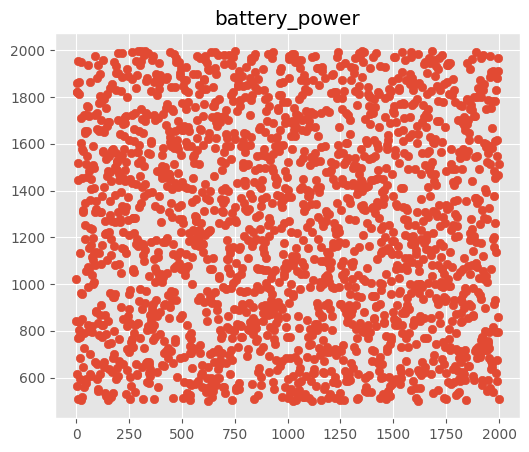

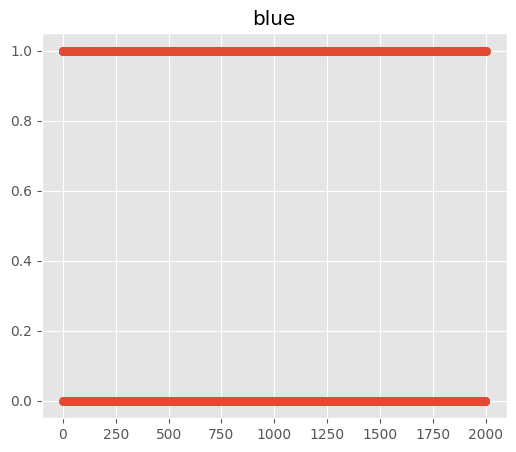

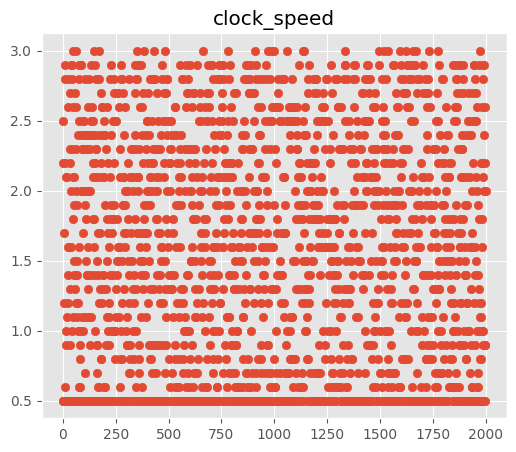

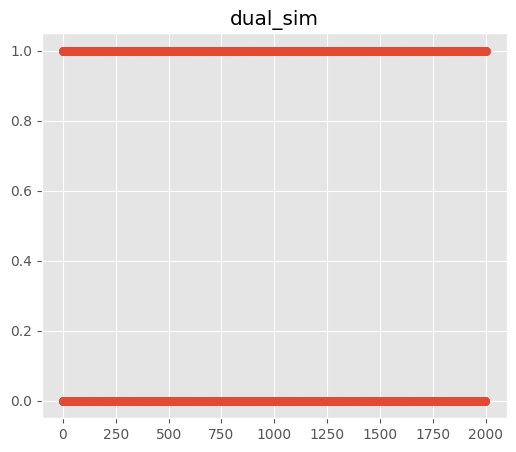

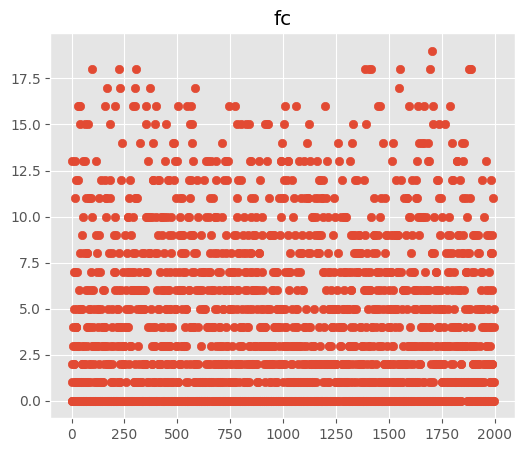

...

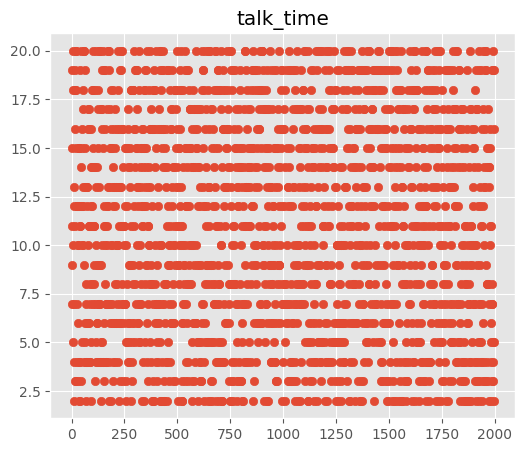

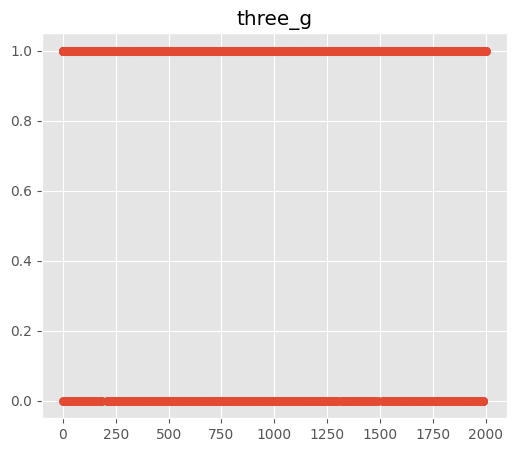

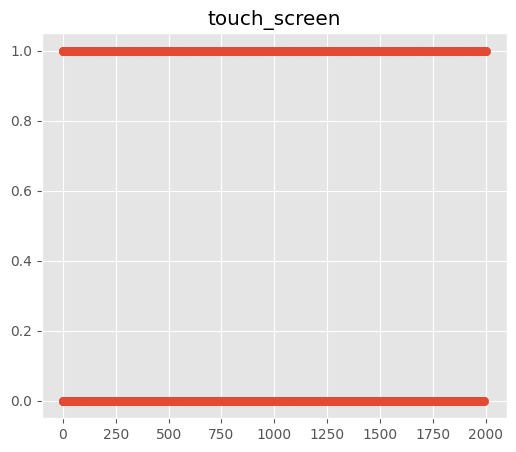

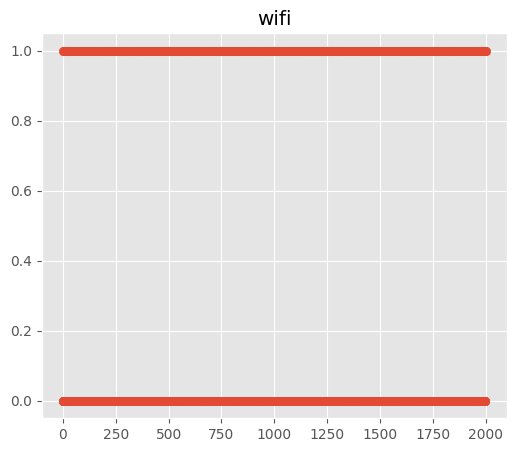

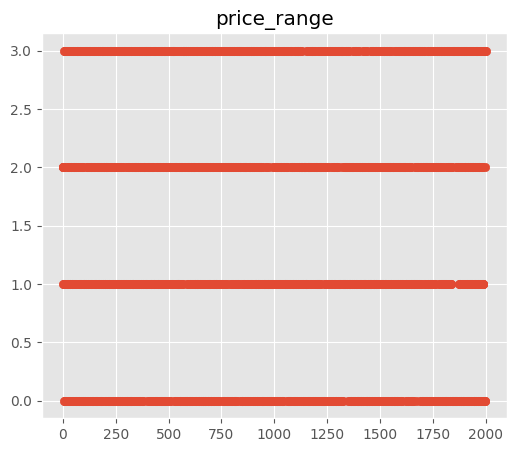

In [56]:
for col in df.select_dtypes(include=['int','float']):
    plt.figure(figsize=(6,5))
    ax = plt.scatter(df.index, df[col])
    plt.title(col)
    plt.show(ax)

# [Step 4: Feature Relationships]()<a id="5"></a> <br>

- - Relation variables/variables : (Taux de corre variables/variables>0.9)

<Axes: >

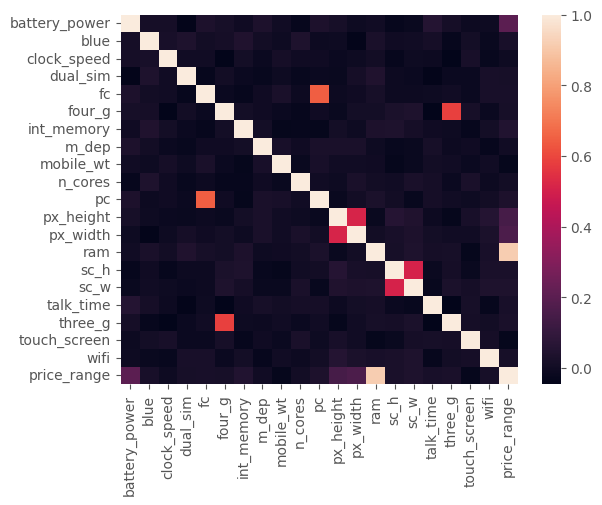

In [57]:
sns.heatmap(df.corr())

c:\Users\Farouq MOUSMI\anaconda3\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


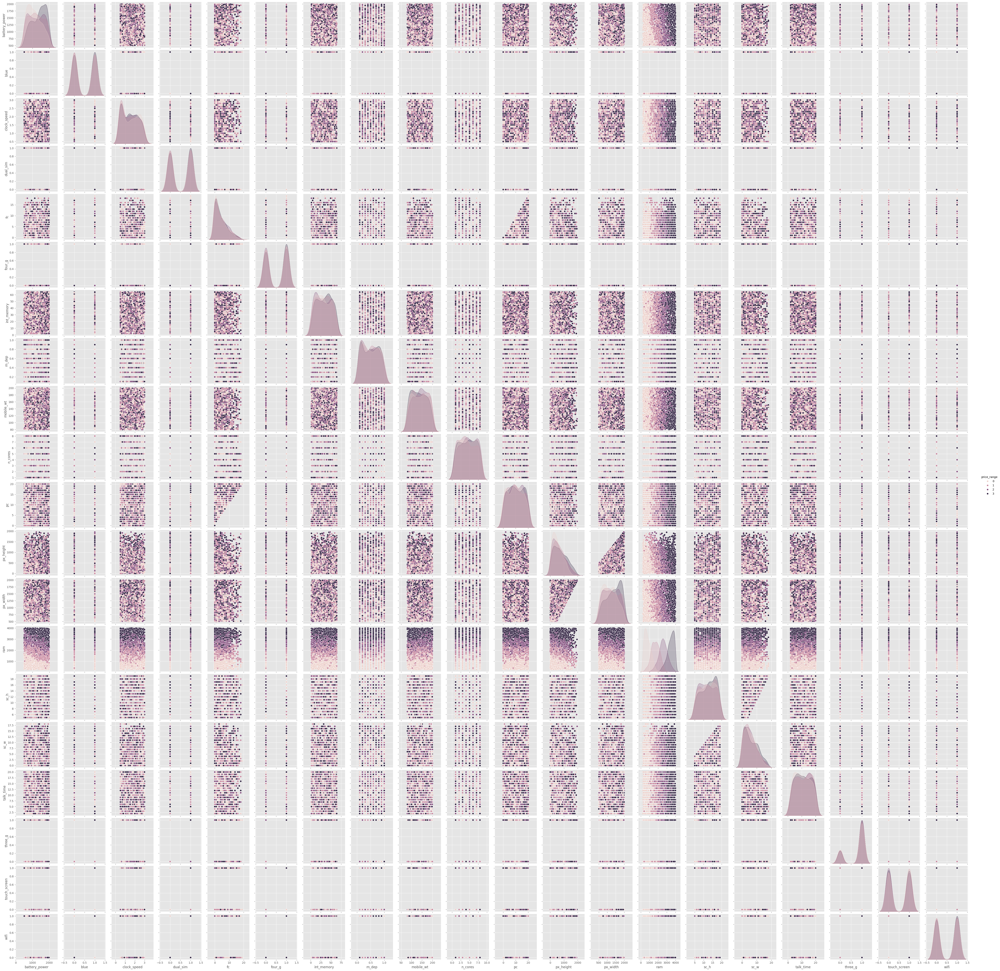

In [58]:
sns.pairplot(df, hue='price_range')
plt.show()

C:\Users\Farouq MOUSMI\AppData\Local\Temp\ipykernel_26588\1691156362.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


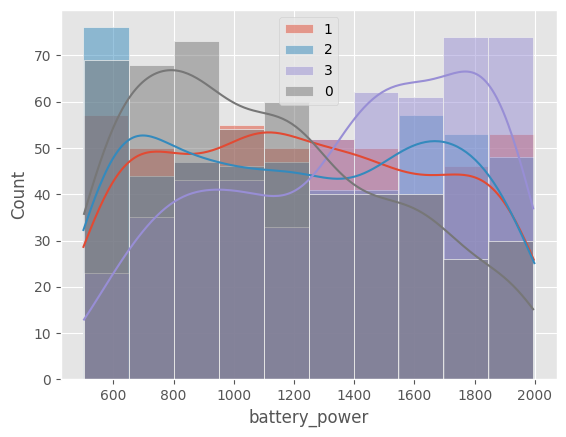

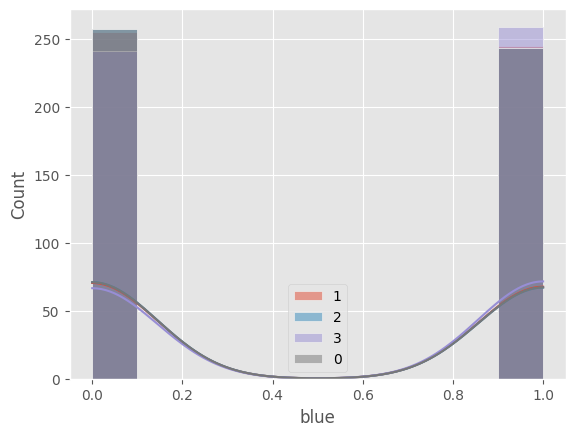

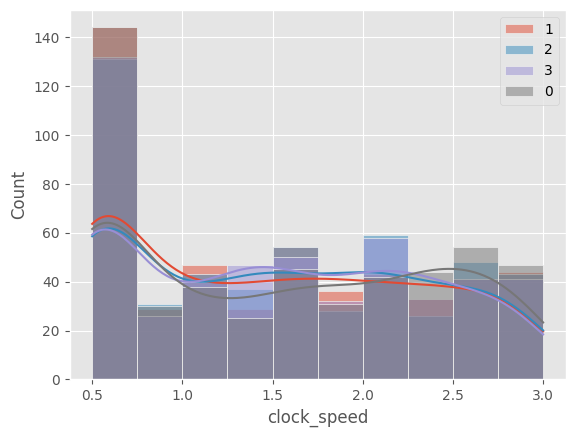

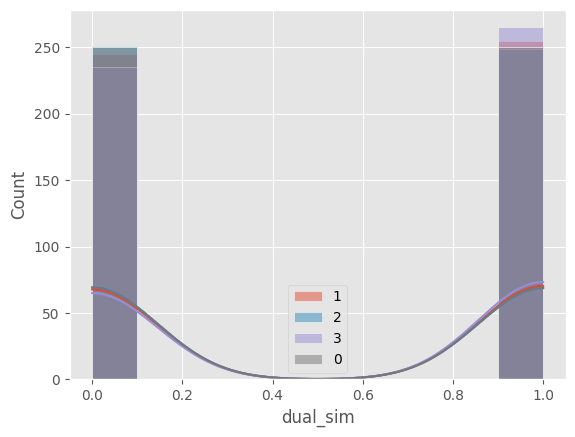

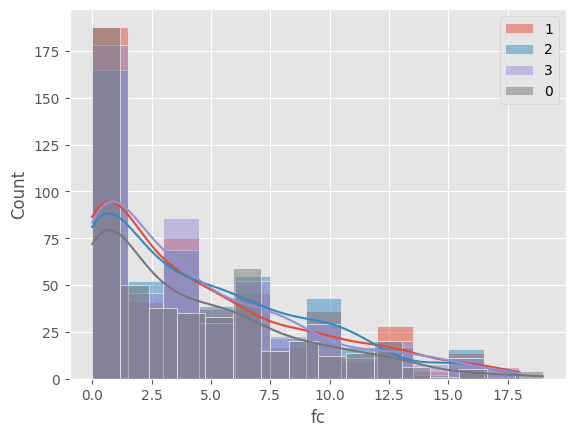

...

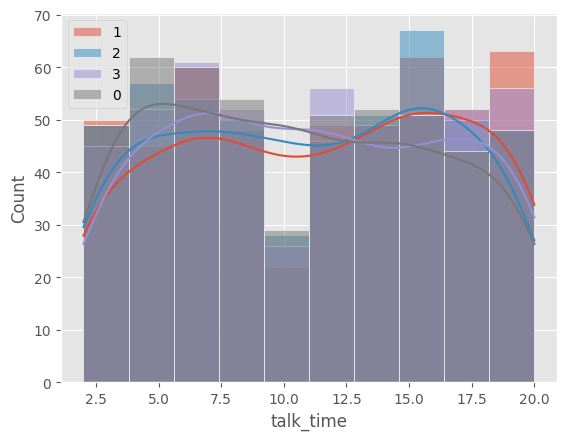

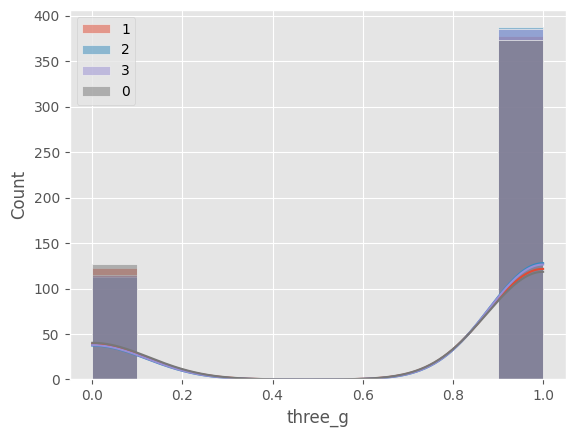

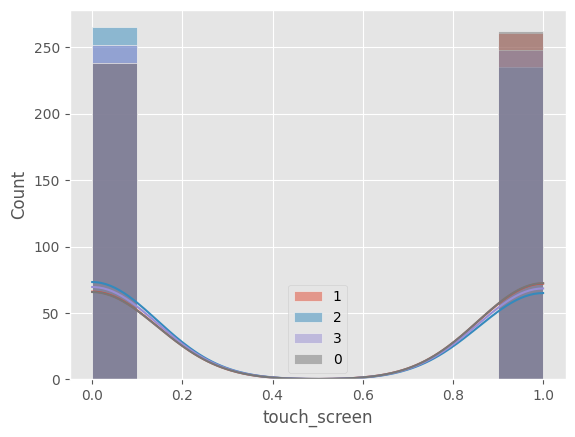

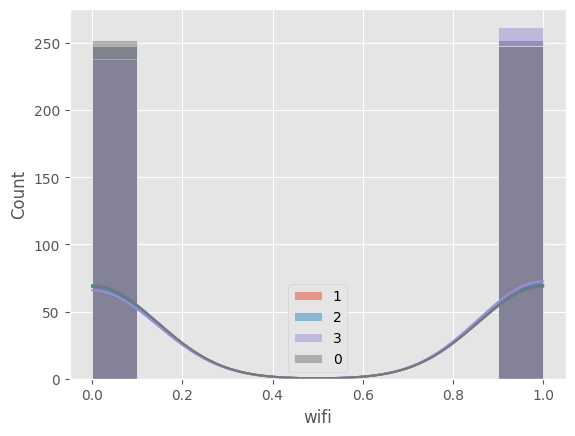

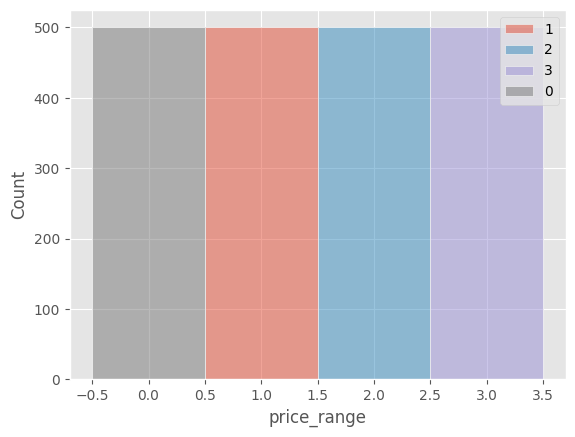

In [59]:
for col in df.select_dtypes(exclude=['object']):
    plt.figure()                                 
    for cat in df['price_range'].unique():
        sns.histplot(df[df['price_range']==cat][col],kde=True,label=cat)
    plt.legend()

- - Relation Column/Column : (very usefull)

In [60]:
df2 = df[['price_range', 'ram']]
df3 = df2.groupby(['price_range'])['ram'].mean()  
df3 = df3.to_frame()
df3 = df3.sort_values('ram', ascending=False)# 
df3


,ram
price_range,
3,3449.232
2,2582.816
1,1679.490
0,785.314


([0, 1, 2, 3],
 [Text(0, 0, '0'), Text(1, 0, '1'), Text(2, 0, '2'), Text(3, 0, '3')])

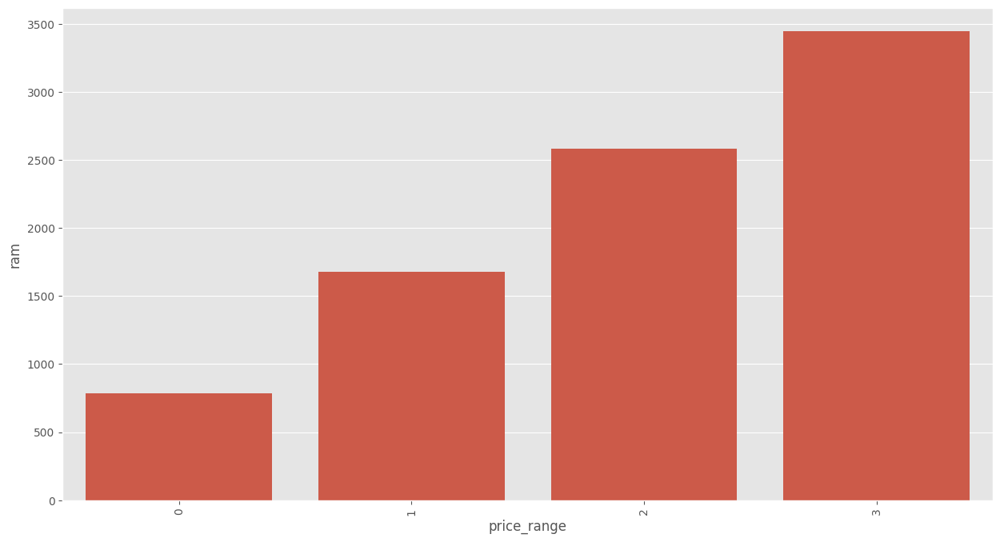

In [61]:
plt.figure(figsize = (15,8))
sns.barplot(df3['ram'])
plt.xticks(rotation = 90)

# [Step 5: Analyse Hypothese]()<a id="6"></a> <br>

- - Rate of 'columns_y' depending to each col => prove if the rate of 'column_y' are not equal

In [62]:
from scipy.stats import ttest_ind                                                            
def t_test(col):
    alpha=0.02
    #=>array[True, False]           
    index_A=df['price_range']==0
    index_B=df['price_range']==1  
    #=>Data_A=Data[rows['column_y']==A] 
    if pd.api.types.is_numeric_dtype(df[col]):
        Data_A = df[index_A]
        Data_B = df[index_B]
        # dropna for eliminating NaN values for the test
        stat, p = ttest_ind(Data_A[col].dropna(), Data_B[col].dropna())                           
        if p < alpha:
            return 'H0 Rejetée X'  # col has a rate not equal for 'column_y' => col has an impact on column_y
        else:
            return 'H0 Non Rejetée'  # col has no significant impact on column_y
    else:
        return 'Not Numeric'  # The column is not numeric   

for col in df.columns:
    print(f'{col :-<50} {t_test(col)}')

battery_power------------------------------------- H0 Rejetée X
blue---------------------------------------------- H0 Non Rejetée
clock_speed--------------------------------------- H0 Non Rejetée
dual_sim------------------------------------------ H0 Non Rejetée
fc------------------------------------------------ H0 Non Rejetée
four_g-------------------------------------------- H0 Non Rejetée
int_memory---------------------------------------- H0 Non Rejetée
m_dep--------------------------------------------- H0 Non Rejetée
mobile_wt----------------------------------------- H0 Non Rejetée
n_cores------------------------------------------- H0 Non Rejetée
pc------------------------------------------------ H0 Non Rejetée
px_height----------------------------------------- H0 Rejetée X
px_width------------------------------------------ H0 Rejetée X
ram----------------------------------------------- H0 Rejetée X
sc_h---------------------------------------------- H0 Non Rejetée
sc_w--------------

c:\Users\Farouq MOUSMI\anaconda3\lib\site-packages\scipy\stats\_axis_nan_policy.py:523: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  res = hypotest_fun_out(*samples, **kwds)


# [Step 6 : Data Cleaning]()<a id="7"></a> <br>

- - Train_test_split

([<matplotlib.patches.Wedge at 0x1abcd56e4a0>,
 [Text(-0.8899187180267095, 0.6465637441936395, 'Data_train'),
  Text(0.8899187482945414, -0.6465637025335375, 'Data_test')],
 [Text(-0.48541020983275057, 0.3526711331965306, '80.0%'),
  Text(0.4854102263424771, -0.3526711104728386, '20.0%')])

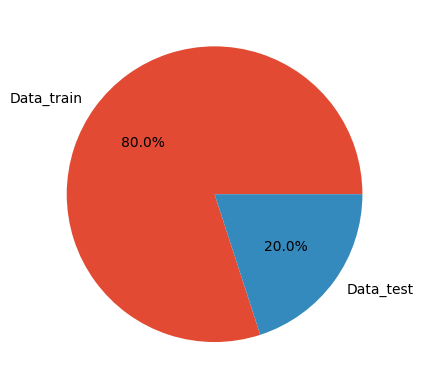

In [95]:
from sklearn.model_selection import train_test_split
Data_train , Data_test = train_test_split(df, test_size=0.2, random_state=0)
#chek if train_size==1-0.2 of all rows
plt.pie((Data_train.shape[0],Data_test.shape[0]), labels=('Data_train', 'Data_test'), autopct='%1.1f%%')

In [96]:
from sklearn.preprocessing import StandardScaler
def prep(data): 
    # alwayse use it
    X = data.drop('price_range',axis=1)
    y = data['price_range']
    return X,y
X_train, y_train = prep(Data_train)
X_test, y_test = prep(Data_test)

# [Step 7: Model Building (If Applicable):]()<a id="8"></a> <br>

- Train the model

In [97]:
from sklearn.tree import DecisionTreeClassifier
model = DecisionTreeClassifier()
model.fit(X_train, y_train)

DecisionTreeClassifier()

# [Step 8: Model Evaluation:]()<a id="9"></a> <br>
- Evaluate the model's performance on the testing set using relevant metrics.

In [98]:
score = model.score(X_test,y_test)
print(score)
y_pred = model.predict(X_test)

0.8375


In [99]:
y_test.shape

(400,)

In [100]:
data.shape

(1000, 20)

- - Only for classification

accuracy_score :  0.8375
confusion_matrix :  [[ 89   6   0   0]
 [  7  71  14   0]
 [  0  12  75  12]
 [  0   1  13 100]]
f1_score :  0.8375
classification_report :                precision    recall  f1-score   support

           0       0.93      0.94      0.93        95
           1       0.79      0.77      0.78        92
           2       0.74      0.76      0.75        99
           3       0.89      0.88      0.88       114

    accuracy                           0.84       400
   macro avg       0.84      0.84      0.84       400
weighted avg       0.84      0.84      0.84       400

recall_score :  [0.93684211 0.77173913 0.75757576 0.87719298]
precision_score :  [0.92708333 0.78888889 0.73529412 0.89285714]


<Axes: >

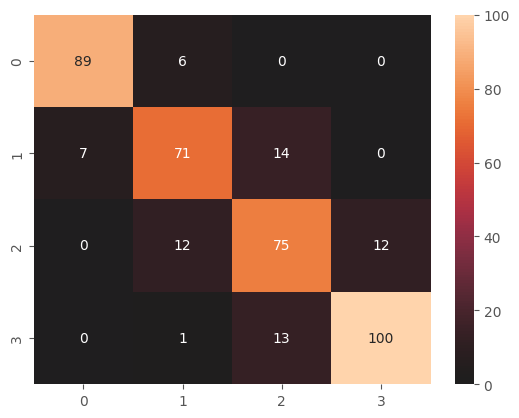

In [101]:
from sklearn.metrics import precision_score, accuracy_score,confusion_matrix, f1_score, recall_score, precision_recall_curve, classification_report

def scoring(y_test,y_pred):
    # Accuracy : acc= -((y-y_pred)**2/(y-y_mean)**2)  #this model describe in % the variation of y
    acc=accuracy_score(y_test, y_pred)        

    #best score is with Diagonal matrix   #visualisation of result               [[TP FP]
    cm = confusion_matrix(y_test, y_pred)                                        #[FN TN]]        

    # F1 Score : 2*(precision*recall)/(precision +recall) #average= can be : None,binary,micro,weighted,samples
    f1 = f1_score(y_test, y_pred, average='micro')         

    # Classification report :    #get (accuracy acc, score f1, cm)
    cr = classification_report(y_test,y_pred)

    # Recall Score : (Sensitivity) (TP / float(TP + FN)) == 1/1+2  #average= can be : None,binary,macro,weighted,samples
    rs = recall_score(y_test, y_pred, average=None)        

    # Precision Score : (Specificity) (TP / float(TP + FP))
    ps = precision_score(y_test, y_pred, average=None)
    return acc,cm,f1,cr,rs,ps

#compare (accuracy acc, score f1, cm)
scoring(y_test,y_pred)              
print("accuracy_score : " , scoring(y_test,y_pred)[0])
print("confusion_matrix : ",  scoring(y_test,y_pred)[1] )
print("f1_score : " , scoring(y_test,y_pred)[2] )
print("classification_report : " , scoring(y_test,y_pred)[3] )
print("recall_score : " , scoring(y_test,y_pred)[4] )
print("precision_score : " , scoring(y_test,y_pred)[5] )
#visualisation of result : best score is with Diagonal matrix
cm = scoring(y_test,y_pred)[1] 
sns.heatmap(cm, center=True, annot=True, fmt="d")     

# [Step 9: Make Pipline:]()<a id="10"></a> <br>

In [102]:
def prep2(data):
    # alwayse use it
    X = data.drop('price_range',axis=1)
    y = data['price_range']
    return X,y
X_train, y_train = prep2(Data_train)
X_test, y_test = prep2(Data_test)

In [103]:
from sklearn.preprocessing import PolynomialFeatures,RobustScaler, StandardScaler,OneHotEncoder
#MinMaxScaler,[Normalizer(copy=True, norm=''l1'or'max'')modif suivant row,MaxAbsScaler(copy=True)modif suivant columns,FunctionTransformer(func=fun1 or lambda x: x**0.1,validate = True),Binarizer(threshold = 1.0),
from sklearn.impute import SimpleImputer,KNNImputer,MissingIndicator

from sklearn.compose import make_column_transformer
from sklearn.pipeline import make_pipeline, make_union

# Use of all models in order to eliminate overfitting => RadForst, AdBoost, SVM, KNN 
num_features = [col for col in df.select_dtypes(exclude=['object']) if col != 'price_range']
categ_features = [col for col in df.select_dtypes(include=['object']) if col != 'price_range']
#Eliminate nan val+StandardScaler
num_pipeline_norm = make_pipeline(KNNImputer(),RobustScaler())
#pas besoin de normalisation (RobustScaler()) (SimpleImputer(missing_values=np.nan, strategy='mean',fill_value=-9)
num_pipeline = make_pipeline(KNNImputer())
# strategy = 'most_frequent',mean,median,constant with fill_value=-99
categ_pipeline = make_pipeline(KNNImputer(),OneHotEncoder())

preprocessor_norm = make_column_transformer((num_pipeline_norm,num_features),(categ_pipeline,categ_features))
preprocessor = make_column_transformer((num_pipeline,num_features),(categ_pipeline,categ_features))
#================Elimin Overfitting (score_train < best_score < score_crossvalue) #=============#
import xgboost as xgb
mod_XGB = make_pipeline(preprocessor_norm,PolynomialFeatures(),xgb.XGBClassifier())
from sklearn.linear_model import LogisticRegression,SGDClassifier
mod_LOG = make_pipeline(preprocessor_norm,PolynomialFeatures(),LogisticRegression(penalty='l2',solver='sag',C=1.0,random_state=33))
mod_SGD = make_pipeline(preprocessor_norm,PolynomialFeatures(),SGDClassifier(random_state=0))
from sklearn.svm import SVC
mod_SVM = make_pipeline(preprocessor_norm,PolynomialFeatures(), SVC(random_state=0))         #must use Scaling standard => -1< X_train <1 & mean=0 & std=1
from sklearn.tree import DecisionTreeClassifier
mod_tree = make_pipeline(preprocessor_norm,PolynomialFeatures(), DecisionTreeClassifier(criterion='gini',max_depth=3,random_state=33))  
from sklearn.neighbors import KNeighborsClassifier
mod_KNN = make_pipeline(preprocessor_norm,PolynomialFeatures(), KNeighborsClassifier())      #Scaling MinMax => 1< X_train <0   
from sklearn.ensemble import RandomForestClassifier,GradientBoostingClassifier, AdaBoostClassifier
mod_RadForst = make_pipeline(preprocessor,PolynomialFeatures(),RandomForestClassifier(random_state=0))    
mod_Gradient = make_pipeline(preprocessor,PolynomialFeatures(),GradientBoostingClassifier(n_estimators=100,max_depth=3,random_state=33) )  
mod_AdBoost = make_pipeline(preprocessor,PolynomialFeatures(),AdaBoostClassifier(random_state=0))

models = {'XGB':mod_XGB,'LOG':mod_LOG,'SGD':mod_SGD,'SVM':mod_SVM,'tree':mod_tree,'KNN':mod_KNN,'RadForst':mod_RadForst,'Gradient':mod_Gradient,'AdBoost':mod_AdBoost}
#Fitting Classificat#=================================#=========================================
accuracy_dict = {}
for nam, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    # Store accuracy in dictionary
    accuracy_dict[nam] = scoring(y_test, y_pred)[0]
    print('result of model nam : ' , nam)
    #compare (accuracy acc, score f1, cm)         
    print("accuracy_score : " , scoring(y_test,y_pred)[0])
    print("confusion_matrix : ",  scoring(y_test,y_pred)[1] )
    print("f1_score : " , scoring(y_test,y_pred)[2] )
    print("classification_report : " , scoring(y_test,y_pred)[3] )
    print("recall_score : " , scoring(y_test,y_pred)[4] )
    print("precision_score : " , scoring(y_test,y_pred)[5] )
# Find the model with the best accuracy
best_model = max(accuracy_dict, key=accuracy_dict.get)
print(f"The best model is {best_model} with an accuracy of {accuracy_dict[best_model]}")

result of model nam :  XGB
accuracy_score :  0.9225
confusion_matrix :  [[ 93   2   0   0]
 [  5  81   6   0]
 [  0   6  85   8]
 [  0   0   4 110]]
f1_score :  0.9225
classification_report :                precision    recall  f1-score   support

           0       0.95      0.98      0.96        95
           1       0.91      0.88      0.90        92
           2       0.89      0.86      0.88        99
           3       0.93      0.96      0.95       114

    accuracy                           0.92       400
   macro avg       0.92      0.92      0.92       400
weighted avg       0.92      0.92      0.92       400

recall_score :  [0.97894737 0.88043478 0.85858586 0.96491228]
precision_score :  [0.94897959 0.91011236 0.89473684 0.93220339]


c:\Users\Farouq MOUSMI\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


result of model nam :  LOG
accuracy_score :  0.8925
confusion_matrix :  [[ 88   7   0   0]
 [  6  81   5   0]
 [  0   6  87   6]
 [  0   0  13 101]]
f1_score :  0.8925
classification_report :                precision    recall  f1-score   support

           0       0.94      0.93      0.93        95
           1       0.86      0.88      0.87        92
           2       0.83      0.88      0.85        99
           3       0.94      0.89      0.91       114

    accuracy                           0.89       400
   macro avg       0.89      0.89      0.89       400
weighted avg       0.89      0.89      0.89       400

recall_score :  [0.92631579 0.88043478 0.87878788 0.88596491]
precision_score :  [0.93617021 0.86170213 0.82857143 0.94392523]
result of model nam :  SGD
accuracy_score :  0.895
confusion_matrix :  [[ 87   8   0   0]
 [  6  85   1   0]
 [  0  13  80   6]
 [  0   0   8 106]]
f1_score :  0.895
classification_report :                precision    recall  f1-score   support


In [104]:
from sklearn.model_selection import GridSearchCV #or RandomizedSearchCV
hyper_params = {'polynomialfeatures__degree': [2, 3, 4]}          
grid = GridSearchCV(mod_XGB, hyper_params,cv=4).fit(X_train,y_train)    #cv=3ou4ou5 == ndr of split
# grid = RandomizedSearchCV(mod_SVM, hyper_params, scoring='recall',cv=4, n_iter=40).fit(X_train,y_train)   #n_iter == 40 iteration by chance
print(grid.best_score_)                      #get best score in GridSearchCV
print(grid.best_params_)                     #get best parametres
model_grid = grid.best_estimator_            #get best model
# 'Fit :
model_grid.fit(X_train,y_train)
y_pred = model_grid.predict(X_test)
# 'Classification_report:
scoring(y_test,y_pred)                           #compare (accuracy acc, score f1, cm)
# use crosse_validation_score cv  #tr_score : Decreasess ,increases / val_score : stagnate

KeyboardInterrupt: 